### Import packages and functions

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import seaborn as sns
import scipy.stats
import anndata
import os
import scipy as scipy
import scipy as sp
import pickle as pkl
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from statsmodels.nonparametric.smoothers_lowess import lowess
from numpy import asarray as ar
from collections import Counter
import networkx as nx
import igraph
import glob
import sys
sys.path.append("/mnt/Science_revision/")
#Hashsolo imported from: https://github.com/theislab/scanpy/blob/master/scanpy/external/pp/_hashsolo.py
from hashsolo import hashsolo

os.getcwd()
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=100, color_map='Blues')
sc.logging.print_version_and_date()
sc.logging.print_header()

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-w4vsgarw because the default path (/home/ubuntu/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


Running Scanpy 1.6.0, on 2022-03-03 18:28.
scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.5 scipy==1.5.4 pandas==1.1.5 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.8 louvain==0.7.0


### Reading input data

In [2]:
meta = pd.read_csv('/mnt/Science_revision/meta_czi-ny.csv')

In [3]:
meta.head(1)

,Sample ID (internal),Sample_ID,Site,Donor ID,Hashtag,Fresh/frozen,Cell type,Sorting,Stimulation,GEX chem,Organ,Protein panel,lib
0,71,D503-BLO-71,NY,D503,C251,Fresh,MNC,No,Nonstim,3'v3,BLO,Protein panel 1,CZINY-0049


In [4]:
meta['lib'].nunique()

32

In [5]:
meta['lib'].unique()

array(['CZINY-0049', 'CZINY-0097', 'CZINY-0050', 'CZINY-0098',
       'CZINY-0051', 'CZINY-0099', 'CZINY-0052', 'CZINY-0100',
       'CZINY-0053', 'CZINY-0101', 'CZINY-0054', 'CZINY-0102',
       'CZINY-0055', 'CZINY-0103', 'CZINY-0056', 'CZINY-0104',
       'CZINY-0057', 'CZINY-0105', 'CZINY-0058', 'CZINY-0106',
       'CZINY-0059', 'CZINY-0107', 'CZINY-0060', 'CZINY-0108',
       'CZINY-0061', 'CZINY-0109', 'CZINY-0062', 'CZINY-0110',
       'CZINY-0063', 'CZINY-0111', 'CZINY-0064', 'CZINY-0112'],
      dtype=object)

In [6]:
meta.shape

(240, 13)

In [7]:
meta['Donor ID'].unique()

array(['D503', 'D496'], dtype=object)

In [8]:
## in UK samples ['combined_ID'] contained both the GEX and HTO/ADT libraries; here only GEX lib is used 

In [9]:
meta['combined_ID'] = meta['lib']

In [10]:
meta['Hashtag+combined_ID'] = meta['Hashtag']+'_'+meta['combined_ID']

In [11]:
meta.index = meta['Hashtag+combined_ID']

In [12]:
meta.head(1)

,Sample ID (internal),Sample_ID,Site,Donor ID,Hashtag,Fresh/frozen,Cell type,Sorting,Stimulation,GEX chem,Organ,Protein panel,lib,combined_ID,Hashtag+combined_ID
Hashtag+combined_ID,,,,,,,,,,,,,,,
C251_CZINY-0049,71,D503-BLO-71,NY,D503,C251,Fresh,MNC,No,Nonstim,3'v3,BLO,Protein panel 1,CZINY-0049,CZINY-0049,C251_CZINY-0049


In [13]:
list(meta['Hashtag'].unique())

['C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258']

In [14]:
samples = list(meta['lib'].unique())

In [15]:
samples

['CZINY-0049',
 'CZINY-0097',
 'CZINY-0050',
 'CZINY-0098',
 'CZINY-0051',
 'CZINY-0099',
 'CZINY-0052',
 'CZINY-0100',
 'CZINY-0053',
 'CZINY-0101',
 'CZINY-0054',
 'CZINY-0102',
 'CZINY-0055',
 'CZINY-0103',
 'CZINY-0056',
 'CZINY-0104',
 'CZINY-0057',
 'CZINY-0105',
 'CZINY-0058',
 'CZINY-0106',
 'CZINY-0059',
 'CZINY-0107',
 'CZINY-0060',
 'CZINY-0108',
 'CZINY-0061',
 'CZINY-0109',
 'CZINY-0062',
 'CZINY-0110',
 'CZINY-0063',
 'CZINY-0111',
 'CZINY-0064',
 'CZINY-0112']

In [16]:
len(samples)

32

In [17]:
meta.head(1)

,Sample ID (internal),Sample_ID,Site,Donor ID,Hashtag,Fresh/frozen,Cell type,Sorting,Stimulation,GEX chem,Organ,Protein panel,lib,combined_ID,Hashtag+combined_ID
Hashtag+combined_ID,,,,,,,,,,,,,,,
C251_CZINY-0049,71,D503-BLO-71,NY,D503,C251,Fresh,MNC,No,Nonstim,3'v3,BLO,Protein panel 1,CZINY-0049,CZINY-0049,C251_CZINY-0049


... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0049-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 283 cells that have less than 600 genes expressed
filtered out 6 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6336
CZINY-0049
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

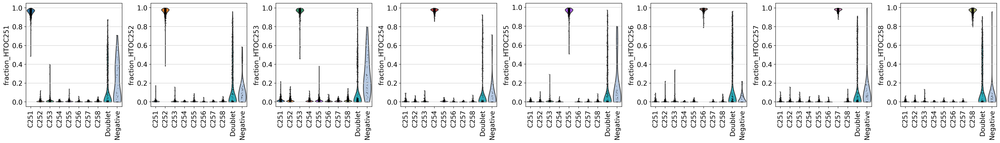

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0097-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 281 cells that have less than 600 genes expressed
filtered out 3 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6004
CZINY-0097
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

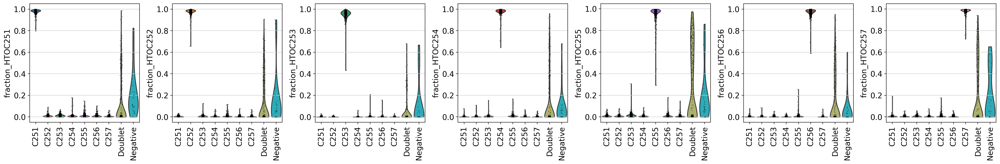

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0050-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 298 cells that have less than 600 genes expressed
filtered out 9 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6161
CZINY-0050
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

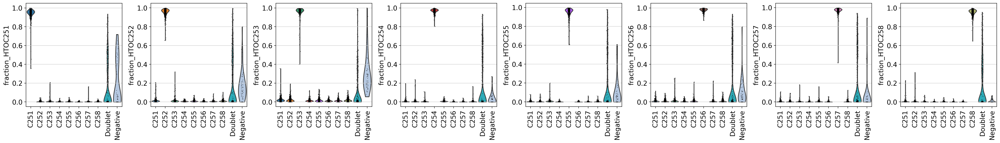

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0098-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 308 cells that have less than 600 genes expressed
filtered out 5 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6462
CZINY-0098
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

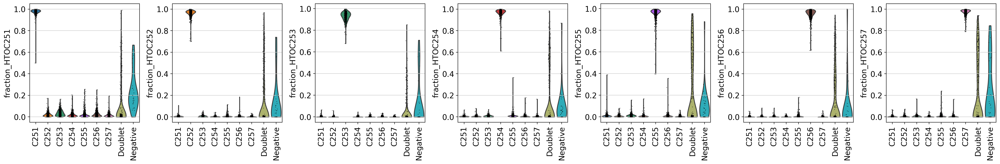

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0051-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 327 cells that have less than 600 genes expressed
filtered out 8 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6712
CZINY-0051
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

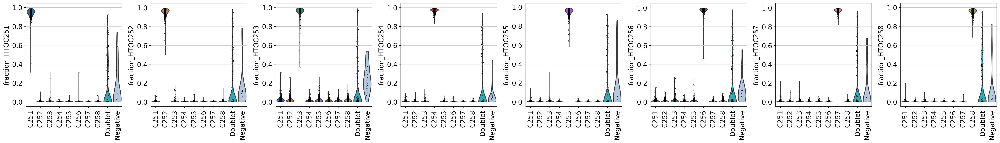

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0099-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 360 cells that have less than 600 genes expressed
filtered out 4 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6643
CZINY-0099
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

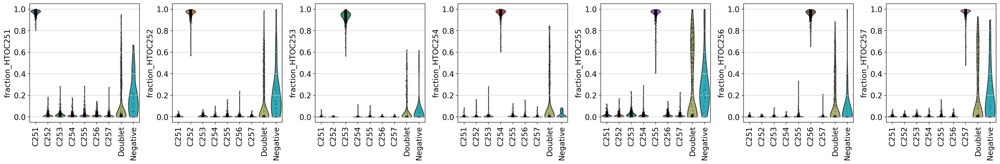

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0052-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 365 cells that have less than 600 genes expressed
filtered out 12 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 7713
CZINY-0052
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

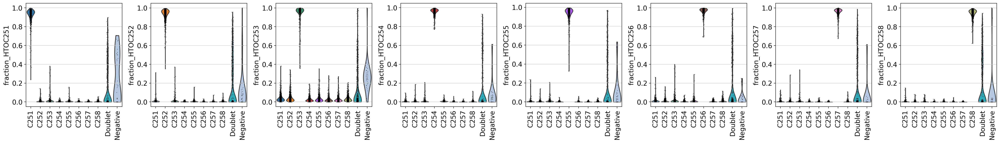

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0100-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 356 cells that have less than 600 genes expressed
filtered out 4 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6318
CZINY-0100
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

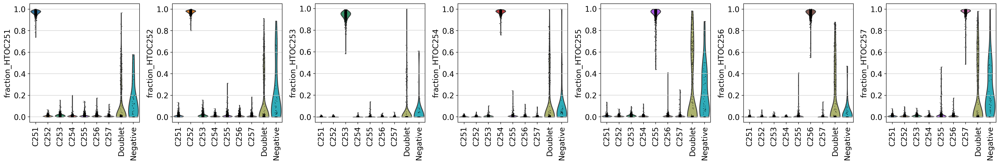

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0053-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 261 cells that have less than 600 genes expressed
filtered out 10 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6712
CZINY-0053
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

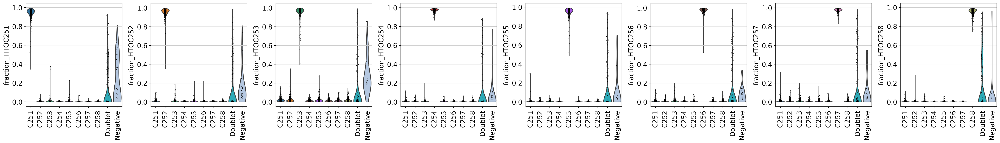

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0101-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 308 cells that have less than 600 genes expressed
filtered out 7 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6246
CZINY-0101
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

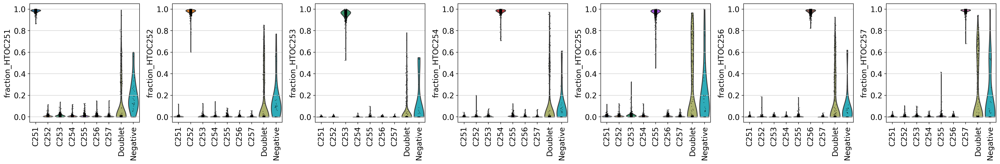

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0054-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 278 cells that have less than 600 genes expressed
filtered out 11 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6910
CZINY-0054
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

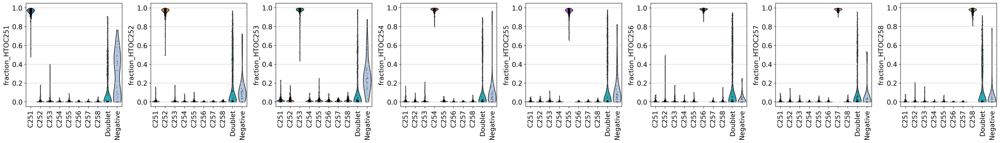

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0102-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 315 cells that have less than 600 genes expressed
filtered out 3 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6728
CZINY-0102
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

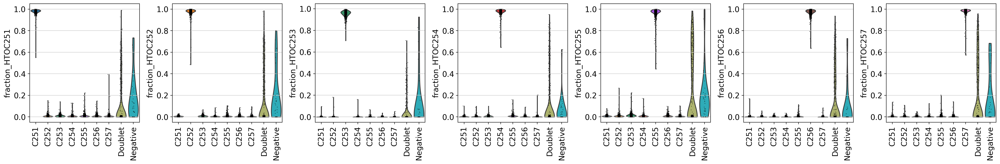

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0055-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 285 cells that have less than 600 genes expressed
filtered out 7 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6120
CZINY-0055
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

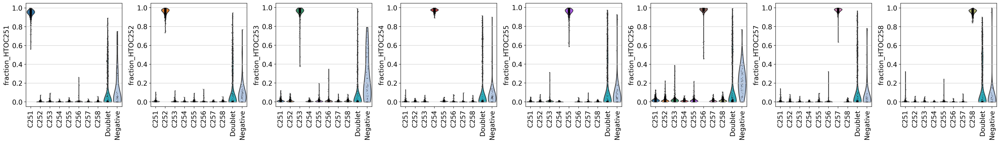

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0103-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 302 cells that have less than 600 genes expressed
filtered out 4 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6297
CZINY-0103
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

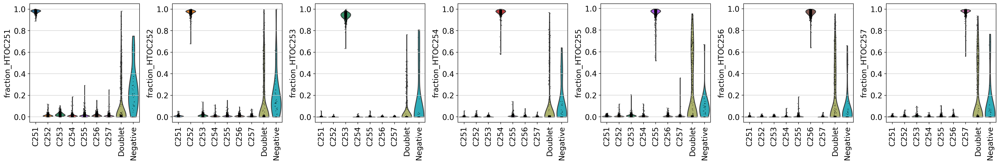

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0056-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 322 cells that have less than 600 genes expressed
filtered out 9 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6928
CZINY-0056
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

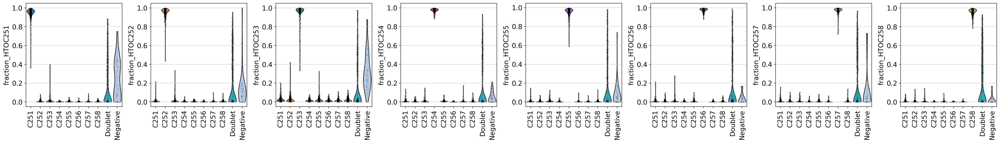

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0104-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 867 cells that have less than 600 genes expressed
filtered out 4 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 7107
CZINY-0104
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

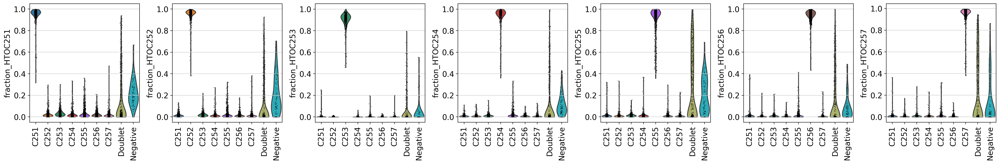

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0057-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 565 cells that have less than 600 genes expressed
filtered out 10 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6924
CZINY-0057
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

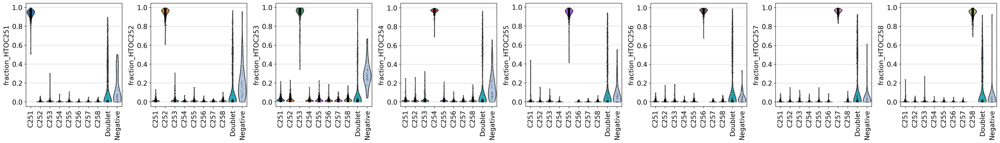

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0105-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 361 cells that have less than 600 genes expressed
filtered out 5 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6680
CZINY-0105
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

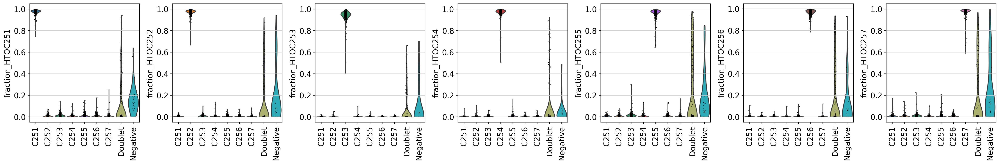

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0058-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 616 cells that have less than 600 genes expressed
filtered out 9 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6763
CZINY-0058
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

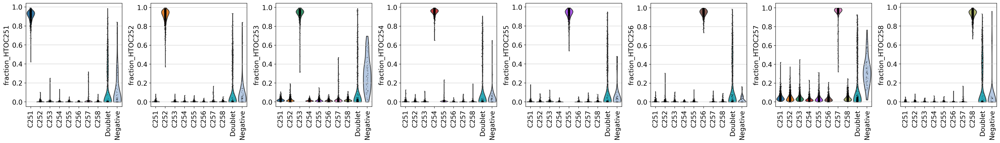

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0106-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 777 cells that have less than 600 genes expressed
filtered out 1 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6448
CZINY-0106
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

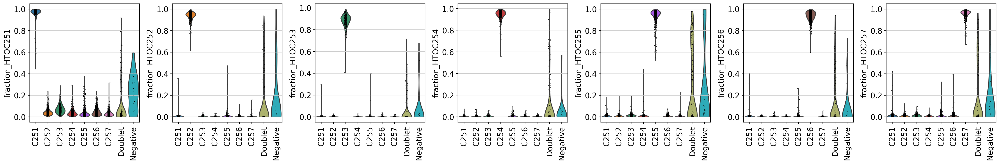

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0059-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 631 cells that have less than 600 genes expressed
filtered out 8 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 7167
CZINY-0059
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

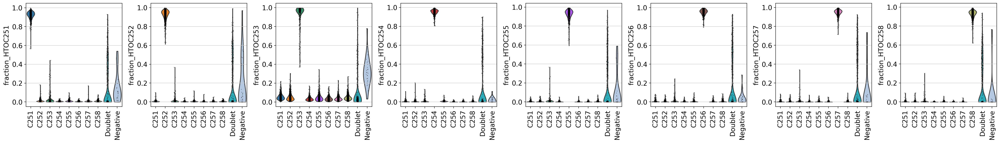

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0107-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 845 cells that have less than 600 genes expressed
Number of cells after min_genes and min_counts filter: 2019
CZINY-0107
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

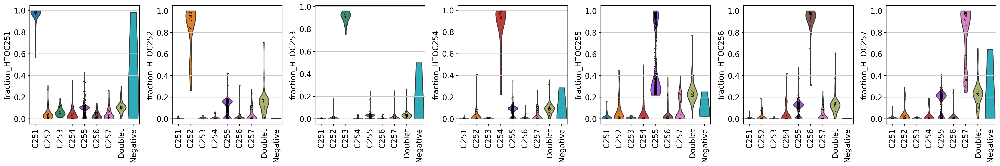

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0060-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 399 cells that have less than 600 genes expressed
filtered out 9 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 5931
CZINY-0060
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

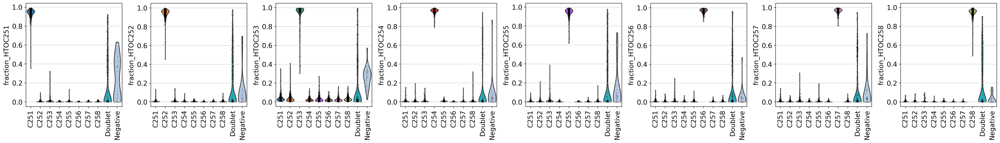

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0108-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 386 cells that have less than 600 genes expressed
filtered out 3 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6393
CZINY-0108
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

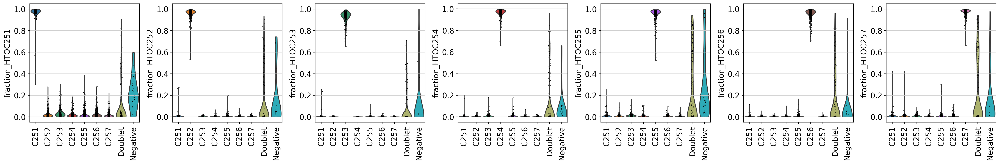

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0061-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 729 cells that have less than 600 genes expressed
filtered out 5 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 7344
CZINY-0061
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

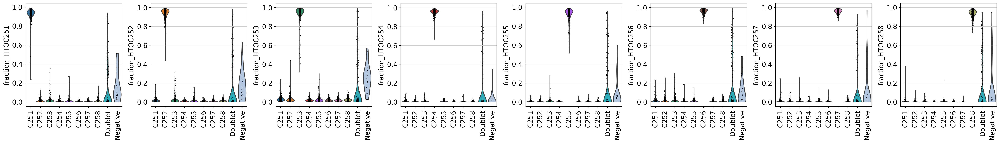

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0109-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 922 cells that have less than 600 genes expressed
filtered out 1 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6327
CZINY-0109
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

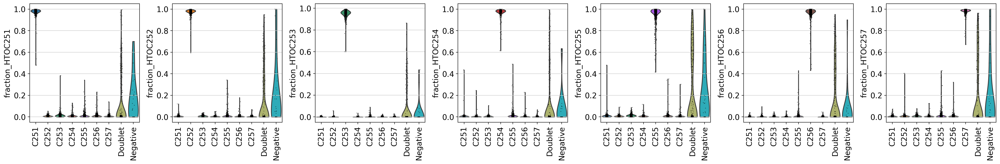

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0062-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 3335 cells that have less than 600 genes expressed
filtered out 9 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 8992
CZINY-0062
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

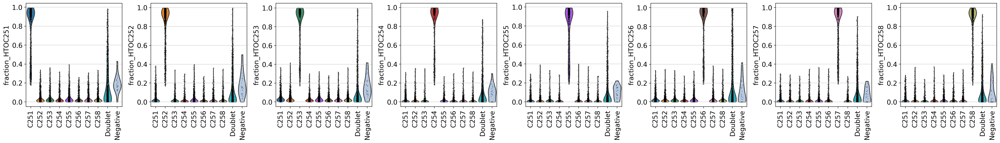

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0110-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 1038 cells that have less than 600 genes expressed
filtered out 3 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6106
CZINY-0110
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

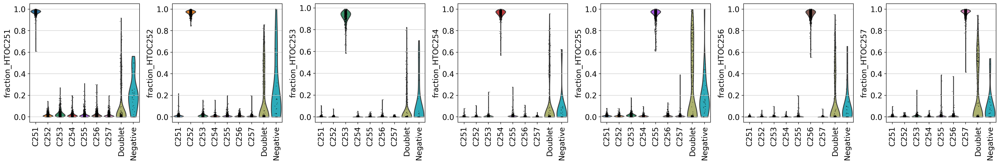

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0063-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 760 cells that have less than 600 genes expressed
filtered out 13 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6642
CZINY-0063
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

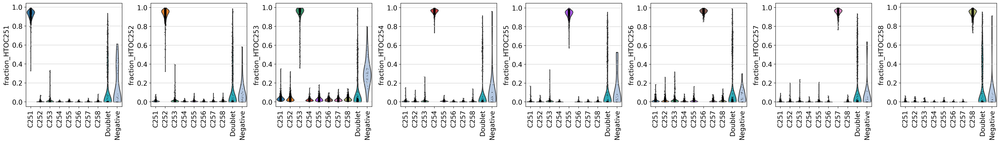

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0111-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 969 cells that have less than 600 genes expressed
filtered out 2 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 7074
CZINY-0111
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

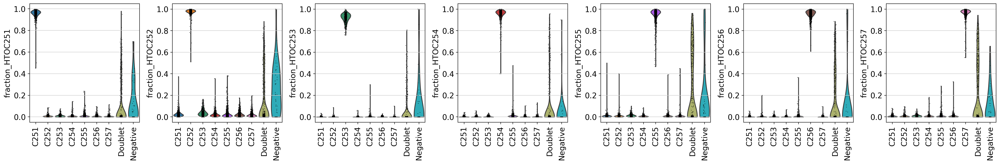

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0064-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 690 cells that have less than 600 genes expressed
filtered out 13 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 8228
CZINY-0064
['D503-BLO-71', 'D503-BMA-72', 'D503-JEJEPI-73', 'D503-JEJLP-74', 'D503-LNG-75', 'D503-LLN-76', 'D503-SPL-77', 'D503-BAL-78']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

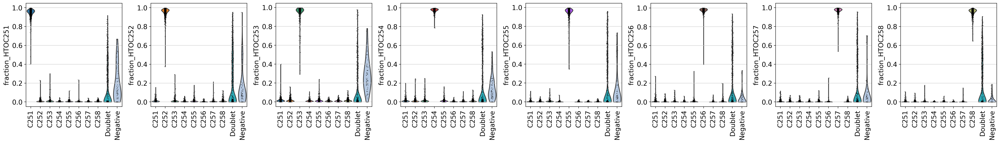

... reading from cache file cache/mnt-Science_revision-rawdata-CZINY-CZINY-0112-filtered_feature_bc_matrix-matrix.h5ad
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
filtered out 1073 cells that have less than 600 genes expressed
filtered out 16 cells that have less than 1000 counts
Number of cells after min_genes and min_counts filter: 6271
CZINY-0112
['D496-BLO-79', 'D496-BMA-80', 'D496-JEJEPI-81', 'D496-JEJLP-82', 'D496-LNG-83', 'D496-LLN-84', 'D496-SPL-85']
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2


... storing 'combined_ID' as categorical
... storing 'Classification' as categorical
... storing 'feature_types' as categorical
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/ubuntu/.local/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passi

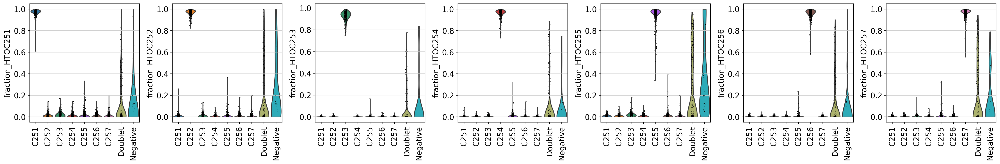

In [18]:
holder = []

hashtags = ['C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258']

for sample in samples:    
    holder.append(sc.read_10x_mtx('/mnt/Science_revision/rawdata/CZINY/'+sample+'/filtered_feature_bc_matrix', cache=True, gex_only=False))
    holder[-1].obs_names = [sample+'_'+i.split('-')[0] for i in holder[-1].obs_names]
    holder[-1].obs['combined_ID'] = sample   
    ##add hashtag counts to adata.obs before adata.X normalization
    holder[-1].obs[hashtags] = holder[-1][:,['C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258']].X.toarray()
    ##calculate hto fractions
    sample_htos = list(meta[meta['combined_ID'] == sample]['Hashtag'])
    hto_var = ['C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258']
    holder[-1].obs['total_hto_counts'] = np.sum(holder[-1][:,hto_var].X, axis=1).A1
    for n in sample_htos:
        holder[-1].obs['fraction_HTO'+n] = holder[-1].obs[n]/holder[-1].obs['total_hto_counts']
        for n in sample_htos:
            holder[-1].obs['fraction_HTO'+n] = holder[-1].obs[n]/holder[-1].obs['total_hto_counts']

    ##remove antibody counts from adata.X 
    protein_flag = holder[-1].var['feature_types'] == 'Antibody Capture'
    holder[-1] = holder[-1][:, ~protein_flag].copy()


    #add fraction of mitochondrial genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    holder[-1].obs['fraction_mito'] = np.sum(
      holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1

    #add the total counts per cell as observations-annotation to adata
    #holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1

    sc.pp.normalize_per_cell(holder[-1], counts_per_cell_after=1e4)
    sc.pp.log1p(holder[-1])

    holder[-1].raw = holder[-1]

    ##QC filter    
    sc.pp.filter_cells(holder[-1], min_genes=600)
    sc.pp.filter_cells(holder[-1], min_counts=1000)
    print('Number of cells after min_genes and min_counts filter: {:d}'.format(holder[-1].n_obs))

    print(sample)
    sample_pool = list(meta[meta['combined_ID'] == sample]['Sample_ID'])
    print(sample_pool)
    holder[-1].obs.shape
    ##hashsolo
    if len(sample_htos)>1:
        hashsolo(holder[-1], cell_hashing_columns=sample_htos, number_of_noise_barcodes=len(sample_htos)-1)
        fract_hto = [col for col in holder[-1].obs if col.startswith('fraction_HTO')]
        sc.pl.violin(holder[-1],keys=fract_hto, groupby='Classification', rotation=90)
        
    else:
        print('THIS SAMPLE IS NOT A POOL')


#### concatenate all objects in the holder list under a single object

In [19]:
adata = holder[0].concatenate(holder[1:], join='outer', index_unique=None)

In [20]:
adata

AnnData object with n_obs × n_vars = 210706 × 36601
    obs: 'combined_ID', 'C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258', 'total_hto_counts', 'fraction_HTOC251', 'fraction_HTOC252', 'fraction_HTOC253', 'fraction_HTOC254', 'fraction_HTOC255', 'fraction_HTOC256', 'fraction_HTOC257', 'fraction_HTOC258', 'fraction_mito', 'n_counts', 'n_genes', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'batch'
    var: 'gene_ids', 'feature_types'

#### Exclude doublets and droplets without assigned hashtag i.e. "Negative", as determined by hashsolo

In [21]:
adata = adata[~adata.obs['Classification'].isin(['Doublet','Negative'])]

In [22]:
adata.obs['Classification'].unique()

array(['C254', 'C255', 'C252', 'C253', 'C258', 'C251', 'C257', 'C256'],
      dtype=object)

#### Create a new column with a concatenation of the assigned hashtag and the combined library ID

In [23]:
adata.obs['hash+lib'] = adata.obs['Classification'].astype(str)+'_'+adata.obs['combined_ID'].astype(str)

Trying to set attribute `.obs` of view, copying.


In [24]:
adata.obs['hash+lib'].unique()

array(['C254_CZINY-0049', 'C255_CZINY-0049', 'C252_CZINY-0049',
       'C253_CZINY-0049', 'C258_CZINY-0049', 'C251_CZINY-0049',
       'C257_CZINY-0049', 'C256_CZINY-0049', 'C255_CZINY-0097',
       'C252_CZINY-0097', 'C254_CZINY-0097', 'C257_CZINY-0097',
       'C256_CZINY-0097', 'C251_CZINY-0097', 'C253_CZINY-0097',
       'C254_CZINY-0050', 'C251_CZINY-0050', 'C257_CZINY-0050',
       'C252_CZINY-0050', 'C253_CZINY-0050', 'C255_CZINY-0050',
       'C258_CZINY-0050', 'C256_CZINY-0050', 'C252_CZINY-0098',
       'C257_CZINY-0098', 'C253_CZINY-0098', 'C251_CZINY-0098',
       'C255_CZINY-0098', 'C254_CZINY-0098', 'C256_CZINY-0098',
       'C257_CZINY-0051', 'C258_CZINY-0051', 'C256_CZINY-0051',
       'C252_CZINY-0051', 'C253_CZINY-0051', 'C254_CZINY-0051',
       'C251_CZINY-0051', 'C255_CZINY-0051', 'C257_CZINY-0099',
       'C256_CZINY-0099', 'C252_CZINY-0099', 'C253_CZINY-0099',
       'C255_CZINY-0099', 'C251_CZINY-0099', 'C254_CZINY-0099',
       'C251_CZINY-0052', 'C253_CZINY-00

In [25]:
adata.obs['sample_ID'] = adata.obs['hash+lib'].map(meta['Sample_ID'])

In [26]:
adata.obs.head(1)

,combined_ID,C251,C252,C253,C254,C255,C256,C257,C258,total_hto_counts,...,n_genes,most_likely_hypothesis,cluster_feature,negative_hypothesis_probability,singlet_hypothesis_probability,doublet_hypothesis_probability,Classification,batch,hash+lib,sample_ID
CZINY-0049_AAACCCAGTACAGTTC,CZINY-0049,3.0,1.0,8.0,329.0,1.0,0.0,2.0,1.0,345.0,...,1578,1,0,1.684087e-07,0.999421,0.000579,C254,0,C254_CZINY-0049,D503-JEJLP-74


In [27]:
 adata.obs['sample_ID'].head(2)

CZINY-0049_AAACCCAGTACAGTTC    D503-JEJLP-74
CZINY-0049_AAACCCAGTAGTCTTG      D503-LNG-75
Name: sample_ID, dtype: object

#### add a column with donor id or organ code only (extract from sample_ID column)

In [28]:
adata.obs['organ_code'] = adata.obs['sample_ID'].str.split('-').str[1]
adata.obs['donor_id'] = adata.obs['sample_ID'].str.split('-').str[0]

In [29]:
adata.obs.head(2)

,combined_ID,C251,C252,C253,C254,C255,C256,C257,C258,total_hto_counts,...,cluster_feature,negative_hypothesis_probability,singlet_hypothesis_probability,doublet_hypothesis_probability,Classification,batch,hash+lib,sample_ID,organ_code,donor_id
CZINY-0049_AAACCCAGTACAGTTC,CZINY-0049,3.0,1.0,8.0,329.0,1.0,0.0,2.0,1.0,345.0,...,0,1.684087e-07,0.999421,0.000579,C254,0,C254_CZINY-0049,D503-JEJLP-74,JEJLP,D503
CZINY-0049_AAACCCAGTAGTCTTG,CZINY-0049,2.0,5.0,22.0,3.0,507.0,2.0,0.0,2.0,543.0,...,0,1.156931e-08,0.974704,0.025296,C255,0,C255_CZINY-0049,D503-LNG-75,LNG,D503


In [32]:
adata

AnnData object with n_obs × n_vars = 193489 × 36601
    obs: 'combined_ID', 'C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258', 'total_hto_counts', 'fraction_HTOC251', 'fraction_HTOC252', 'fraction_HTOC253', 'fraction_HTOC254', 'fraction_HTOC255', 'fraction_HTOC256', 'fraction_HTOC257', 'fraction_HTOC258', 'fraction_mito', 'n_counts', 'n_genes', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'batch', 'hash+lib', 'sample_ID', 'organ_code', 'donor_id'
    var: 'gene_ids', 'feature_types'

In [31]:
#### substitute the blood acronym BLO for BLD

In [32]:
adata.obs = adata.obs.replace(to_replace='BLO',value='BLD')

In [33]:
list(adata.obs['organ_code'].unique())

['JEJLP', 'LNG', 'BMA', 'JEJEPI', 'BAL', 'BLD', 'SPL', 'LLN']

In [34]:
#### remove BAL = bronchoalveolar lavage samples

In [35]:
adata = adata[adata.obs['organ_code'].isin(['JEJLP', 'LNG', 'BMA', 'JEJEPI','BLD', 'SPL', 'LLN'])]

In [36]:
adata

View of AnnData object with n_obs × n_vars = 175777 × 36601
    obs: 'combined_ID', 'C251', 'C252', 'C253', 'C254', 'C255', 'C256', 'C257', 'C258', 'total_hto_counts', 'fraction_HTOC251', 'fraction_HTOC252', 'fraction_HTOC253', 'fraction_HTOC254', 'fraction_HTOC255', 'fraction_HTOC256', 'fraction_HTOC257', 'fraction_HTOC258', 'fraction_mito', 'n_counts', 'n_genes', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'batch', 'hash+lib', 'sample_ID', 'organ_code', 'donor_id'
    var: 'gene_ids', 'feature_types'

In [37]:
adata.write('/mnt/Science_revision/write/TICA_hashtagged3prime_donors.h5ad')

/home/ubuntu/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1237: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'combined_ID' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Classification' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'hash+lib' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_ID' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'organ_code' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'donor_id' as categorical
